**Brief Information About the Warm Up:**

- The evaluation metric used is MAPE (Mean Absolute Percentage Error).
- The agri-food sector includes the production, processing and distribution of food which requires significant natural resources, energy and emissions, contributing significantly to global warming. Therefore, the goal is to **predict global warming based on the factors related to agri-food sector.**

In [1]:
# Import library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Setup pandas
pd.set_option('display.max_columns', None)

In [2]:
# Get the current working directory
os.getcwd()

'/Users/ahmadyusufalbadri/Documents/1 - Learning/4 - Competition/datavidia 2025/Datavidia'

In [3]:
# Import train data
df_train = pd.read_csv('data/train.csv')
df_train.sample(5)

,Unnamed: 0,Negara/Tahun,Emisi Savanna Api,Emisi Kebakaran Hutan,Emisi Residu Tanaman,Emisi Budidaya Padi,Emisi Tanah Organik Yang Dikeringkan (Co2),Emisi Pembuatan Pestisida,Emisi Transportasi Makanan,Lahan Hutan,Konversi Hutan Bersih,Emisi Konsumsi Rumah Tangga Makanan,Emisi Ritel Makanan,Emisi Penggunaan Listrik Di Pertanian,Emisi Kemasan Makanan,Emisi Sistem Agrifood Pembuangan Limbah,Emisi Pengolahan Makanan,Emisi Manufaktur Pupuk,Emisi IPPU,Emisi Kotoran Diterapkan Pada Tanah,Emisi Pupuk Kandang Di Padang Rumput,Emisi Manajemen Pupuk,Emisi Kebakaran Di Tanah Organik,Emisi Kebakaran Di Hutan Tropis Yang Lembab,Penggunaan Energi Di Pertanian,Populasi Pedesaan,Populasi Perkotaan,Total Populasi - Pria,Total Populasi - Wanita,Emisi Total,Peningkatan Suhu Rata - Rata ° C
3359,3359,Mongolia/2011,891.0175,38.3699,35.1969,319.680801,22559.8439,6.000000,205.727700,0.0000,153.9919,443.8505,435.9204,42.755700,332.005034,2505.5094,1233.812506,398.705622,250.2715,514.4882,3245.072100,832.1395,0.0,0.0000,23.1978,884714.0,1876802.0,1366548.0,1377389.0,34467.556864,0.624083
4091,4091,Puerto Rico/1991,0.0683,0.2661,0.0302,0.000000,134.2189,133.616818,1841.653064,-1247.6938,0.0000,904.2383,1008.6903,28.519600,108.348674,994.6923,320.834899,10753.102392,NaN,52.9869,255.624600,55.9322,0.0,0.2661,NaN,244850.0,3306737.0,1732097.0,1846353.0,15345.395847,0.359833
2271,2271,Haiti/2003,0.0668,0.0000,34.1392,170.284800,0.0000,0.000000,88.857900,-137.8356,207.2246,49.2076,1152.3336,23.948334,67.631366,2651.7167,220.213857,363.146066,144.0262,133.9400,907.074000,195.1913,0.0,0.0000,38.9864,5328009.0,3648543.0,4376534.0,4435711.0,6310.153122,1.181167
2883,2883,Liberia/1996,0.1979,48.5373,11.5862,24.893600,93.2973,12.232871,13.654800,-377.9245,13660.1480,NaN,0.1917,506.028170,212.033652,79.9711,294.067022,599.422429,19.0134,12.8092,61.622500,23.4690,0.0,48.5373,3.1710,1249761.0,941418.0,1084387.0,1119580.0,15346.959944,0.609833
3889,3889,Palau/2014,0.0000,0.0000,NaN,1639.724833,0.0000,11.481085,12.920300,NaN,NaN,2.0101,4.1750,1.560400,74.018133,0.6306,483.126100,2791.684228,1.1087,NaN,6250.660317,NaN,0.0,0.0000,11.5299,4743.0,16351.0,9443.0,8353.0,11284.629694,0.959182


In [4]:
# Import test data
df_test = pd.read_csv('data/test.csv')
df_test.sample(5)

,Unnamed: 0,Negara/Tahun,Emisi Savanna Api,Emisi Kebakaran Hutan,Emisi Residu Tanaman,Emisi Budidaya Padi,Emisi Tanah Organik Yang Dikeringkan (Co2),Emisi Pembuatan Pestisida,Emisi Transportasi Makanan,Lahan Hutan,Konversi Hutan Bersih,Emisi Konsumsi Rumah Tangga Makanan,Emisi Ritel Makanan,Emisi Penggunaan Listrik Di Pertanian,Emisi Kemasan Makanan,Emisi Sistem Agrifood Pembuangan Limbah,Emisi Pengolahan Makanan,Emisi Manufaktur Pupuk,Emisi IPPU,Emisi Kotoran Diterapkan Pada Tanah,Emisi Pupuk Kandang Di Padang Rumput,Emisi Manajemen Pupuk,Emisi Kebakaran Di Tanah Organik,Emisi Kebakaran Di Hutan Tropis Yang Lembab,Penggunaan Energi Di Pertanian,Populasi Pedesaan,Populasi Perkotaan,Total Populasi - Pria,Total Populasi - Wanita,Emisi Total
370,370,Dominican Republic/2019,2.8827,5.3026,59.8619,1373.195300,0.0000,207.000000,850.7194,-2161.0050,603.68,1313.5917,1718.0554,714.572600,256.16340,4269.0163,1534.297100,363.146066,2230.0321,404.9664,1577.8698,361.7951,0.0,1.8067,332.9299,1998330.0,8998444.0,5472410.0,5409472.0,16019.879466
0,0,Afghanistan/2015,0.8454,0.0000,403.3181,642.880000,0.0000,81.852555,440.0315,-246.2191,0.00,1570.3394,370.6039,75.161400,353.93064,3090.5068,1645.129815,27.235400,256.7030,423.5038,2719.1528,797.9007,0.0,0.0000,NaN,25368923.0,8367571.0,17071446.0,16682054.0,12652.876111
506,506,Grenada/2017,0.0000,0.0000,0.0303,448.164725,0.0000,11.481085,11.1454,0.0000,0.00,15.8129,20.2818,17.004663,98.42874,32.9811,209.587728,658.540604,3.9767,0.8284,3.9467,0.9264,0.0,0.0000,0.0415,68831.0,38994.0,60681.0,60239.0,1533.178744
641,641,Jordan/2020,0.2109,0.0000,7.8891,246.407276,0.0000,14.000000,778.4384,0.0000,0.00,1171.5635,517.9974,1200.423200,10.62300,2072.3285,4.004700,1153.622700,2849.7167,19.7443,394.1619,43.4223,0.0,0.0000,313.0803,876059.0,9332603.0,5670775.0,5257947.0,10797.634176
1179,1179,Sweden/2018,5.6417,9.0590,205.4916,653.496807,9491.3842,26.000000,1482.5360,-44979.5867,23845.36,75.3251,459.8932,16.303000,383.82500,888.0167,662.508500,943.417794,9872.7624,381.4990,318.8342,923.0311,0.0,0.0000,1346.1066,1254718.0,8727991.0,5105006.0,5057292.0,7010.905202


In [5]:
# Check on sample submission data
sample_submission = pd.read_csv('data/sample_submission.csv')
sample_submission.head()

,id,Peningkatan Suhu Rata - Rata ° C
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0


In [6]:
# Check the dimension of test and sample submission
print(sample_submission.shape)
print(df_test.shape)

(1362, 2)
(1362, 30)


In [7]:
# Check train and test data on country and year availability

# First, add the negara and tahun column
df_test[['Negara', 'Tahun']] = df_test['Negara/Tahun'].str.split('/', expand=True)
df_test = df_test.iloc[:, 2:]
df_train[['Negara', 'Tahun']] = df_train['Negara/Tahun'].str.split('/', expand=True)
df_train = df_train.iloc[:, 2:]

In [8]:
# Sampling year availability of country in the train and test data
def sample_data_check(data_train, data_test, country_name):
    train = data_train[data_train['Negara'] == country_name]['Tahun'].unique()
    test = data_test[data_test['Negara'] == country_name]['Tahun'].unique()
    print(f'Sample on {country_name}: \n')
    print(f'Training data has {len(train)} years of data as follow:')
    print(train)
    print(f'\nTest data has {len(test)} years of data as follow:')
    print(test)

In [9]:
# Sampling on Turkmenistan
sample_data_check(df_train, df_test, 'Turkmenistan')

Sample on Turkmenistan: 

Training data has 23 years of data as follow:
['1992' '1993' '1994' '1995' '1996' '1997' '1998' '1999' '2000' '2001'
 '2002' '2003' '2004' '2005' '2006' '2007' '2008' '2009' '2010' '2011'
 '2012' '2013' '2014']

Test data has 6 years of data as follow:
['2015' '2016' '2017' '2018' '2019' '2020']


In [10]:
# Sampling on Indonesia
sample_data_check(df_train, df_test, 'Indonesia')

Sample on Indonesia: 

Training data has 25 years of data as follow:
['1990' '1991' '1992' '1993' '1994' '1995' '1996' '1997' '1998' '1999'
 '2000' '2001' '2002' '2003' '2004' '2005' '2006' '2007' '2008' '2009'
 '2010' '2011' '2012' '2013' '2014']

Test data has 6 years of data as follow:
['2015' '2016' '2017' '2018' '2019' '2020']


In [11]:
# Count the number of countries
print(df_test['Negara'].nunique(dropna=False))
print(df_train['Negara'].nunique(dropna=False))

227
236


In [12]:
# Check total country
temp = np.append(df_test['Negara'].unique(), df_train['Negara'].unique())
unique_element = np.unique(temp)
print(len(unique_element))

236


In [13]:
# Check years availability
def year_check(data):
    temp = data.groupby('Negara')['Tahun'].nunique(dropna=False).reset_index()
    temp = temp.groupby('Tahun')['Negara'].nunique()
    
    # Create a bar chart
    temp.plot.bar()
    
    # Add labels on top of bars
    for i, v in enumerate(temp.values):
        plt.text(i, v + 5, str(v), ha='center', fontsize=12)
    
    # Set y-axis limit (max height)
    plt.ylim(0, max(temp) + 25)
    
    # Title and labels
    plt.xlabel("# Years Available")
    plt.ylabel("# Countries")
    
    plt.show()

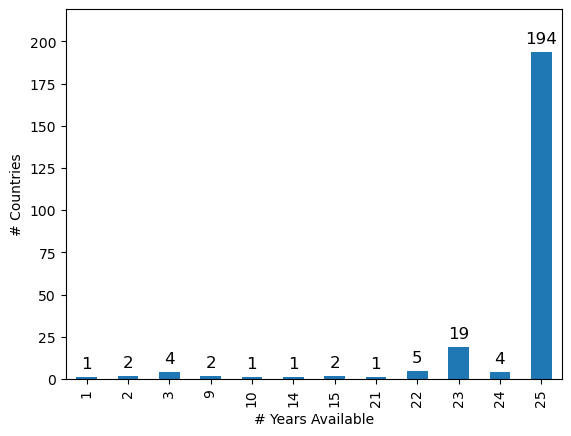

In [14]:
# Check on training data
year_check(df_train)

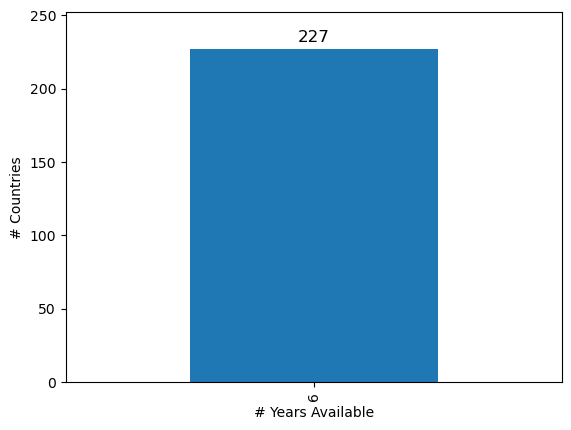

In [15]:
# Check on testing data
year_check(df_test)

In [16]:
# Check country with only 15 years of available data in train data
temp = df_train.groupby('Negara')['Tahun'].nunique(dropna=False).reset_index()
temp[temp['Tahun'] == 15]

,Negara,Tahun
19,Belgium,15
123,Luxembourg,15


In [17]:
# Check sample of belgium
sample_data_check(df_train, df_test, 'Belgium')

Sample on Belgium: 

Training data has 15 years of data as follow:
['2000' '2001' '2002' '2003' '2004' '2005' '2006' '2007' '2008' '2009'
 '2010' '2011' '2012' '2013' '2014']

Test data has 6 years of data as follow:
['2015' '2016' '2017' '2018' '2019' '2020']


In [18]:
# Check sample of Luxembourg
sample_data_check(df_train, df_test, 'Luxembourg')

Sample on Luxembourg: 

Training data has 15 years of data as follow:
['2000' '2001' '2002' '2003' '2004' '2005' '2006' '2007' '2008' '2009'
 '2010' '2011' '2012' '2013' '2014']

Test data has 6 years of data as follow:
['2015' '2016' '2017' '2018' '2019' '2020']


In [19]:
# Check training data
temp = df_train.groupby('Negara')['Tahun'].agg(['nunique', 'min', 'max']).reset_index()
temp2 = df_test.groupby('Negara')['Tahun'].agg(['nunique', 'min', 'max']).reset_index()
temp = temp.merge(temp2, how='left', on='Negara') # suffix x and y for train and test data respectively
temp

,Negara,nunique_x,min_x,max_x,nunique_y,min_y,max_y
0,Afghanistan,25,1990,2014,6.0,2015,2020
1,Albania,25,1990,2014,6.0,2015,2020
2,Algeria,25,1990,2014,6.0,2015,2020
3,American Samoa,25,1990,2014,6.0,2015,2020
4,Andorra,25,1990,2014,6.0,2015,2020
...,...,...,...,...,...,...,...
231,Western Sahara,25,1990,2014,6.0,2015,2020
232,Yemen,25,1990,2014,6.0,2015,2020
233,Yugoslav SFR,2,1990,1991,NaN,NaN,NaN
234,Zambia,25,1990,2014,6.0,2015,2020


In [20]:
# Check test data period
temp.min_y.unique(), temp.max_y.unique()

(array(['2015', nan], dtype=object), array(['2020', nan], dtype=object))

In [21]:
# Check test data period
temp.groupby(['min_x', 'max_x'])['Negara'].nunique()

min_x  max_x
1990   1990       1
       1991       2
       1992       2
       1999       1
       2010       1
       2011       1
       2014     194
1991   2014       4
1992   2005       1
       2014      19
1993   2014       4
2000   2014       2
2006   2014       2
2012   2014       2
Name: Negara, dtype: int64

In [22]:
temp.groupby('max_x')['nunique_y'].count()

max_x
1990      0
1991      0
1992      0
1999      0
2005      0
2010      0
2011      0
2014    227
Name: nunique_y, dtype: int64

From quick check of the data, we know that:
1. We don't have any information about the global warming in the test data which will be used for submission to kaggle.
2. The submission format is simple, we just need to save the prediction of the global warming in celcius for all of the 1,362 rows and add the first row with id, i.e., the index value of each row/observation.
3. There are 236 countries in the total of train (236) and test data (227) which shows that some countries in the train data are not available in the test data.
5. Looking at a sample of Turkmenistan, it seems that the splitting of train and test data use panel data logic for upcoming year, which use the next year period for testing.
6. Test data only available for countries that has a period until 2014 in training data (which is 227 countries), because in the test data we need to "forecast" or predict the global warming for these countries from 2015 until 2020.

In [113]:
# Check missing values and duplicates
print(df_train.isna().sum().sort_values(ascending=False))
print()
print(df_train.duplicated().sum())

Emisi Residu Tanaman                           1118
Penggunaan Energi Di Pertanian                  782
Emisi Kotoran Diterapkan Pada Tanah             752
Emisi Manajemen Pupuk                           752
Emisi IPPU                                      599
Lahan Hutan                                     397
Konversi Hutan Bersih                           397
Emisi Konsumsi Rumah Tangga Makanan             389
Emisi Kebakaran Di Hutan Tropis Yang Lembab     125
Emisi Kebakaran Hutan                            75
Emisi Savanna Api                                25
Emisi Penggunaan Listrik Di Pertanian             0
Populasi Pedesaan                                 0
lat                                               0
country                                           0
Tahun                                             0
Negara                                            0
Peningkatan Suhu Rata - Rata ° C                  0
Emisi Total                                       0
Total Popula

In [119]:
# Get non missing values column
nonmissing_col = df_train.isna().sum()
nonmissing_col = nonmissing_col[nonmissing_col == 0].index.to_list()
nonmissing_col

['Emisi Budidaya Padi',
 'Emisi Tanah Organik Yang Dikeringkan (Co2)',
 'Emisi Pembuatan Pestisida',
 'Emisi Transportasi Makanan',
 'Emisi Ritel Makanan',
 'Emisi Penggunaan Listrik Di Pertanian',
 'Emisi Kemasan Makanan',
 'Emisi Sistem Agrifood Pembuangan Limbah',
 'Emisi Pengolahan Makanan',
 'Emisi Manufaktur Pupuk',
 'Emisi Pupuk Kandang Di Padang Rumput',
 'Emisi Kebakaran Di Tanah Organik',
 'Populasi Pedesaan',
 'Populasi Perkotaan',
 'Total Populasi - Pria',
 'Total Populasi - Wanita',
 'Emisi Total',
 'Peningkatan Suhu Rata - Rata ° C',
 'Negara',
 'Tahun',
 'country',
 'lat',
 'lon']

In [120]:
# Adjust year to int
df_train['Tahun'] = df_train['Tahun'].astype(int)
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5603 entries, 0 to 5602
Data columns (total 34 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Emisi Savanna Api                            5578 non-null   float64
 1   Emisi Kebakaran Hutan                        5528 non-null   float64
 2   Emisi Residu Tanaman                         4485 non-null   float64
 3   Emisi Budidaya Padi                          5603 non-null   float64
 4   Emisi Tanah Organik Yang Dikeringkan (Co2)   5603 non-null   float64
 5   Emisi Pembuatan Pestisida                    5603 non-null   float64
 6   Emisi Transportasi Makanan                   5603 non-null   float64
 7   Lahan Hutan                                  5206 non-null   float64
 8   Konversi Hutan Bersih                        5206 non-null   float64
 9   Emisi Konsumsi Rumah Tangga Makanan          5214 non-null   float64
 10  

In [126]:
# Make a dedicated data for nonmissing columns
df_train_nonmissing = df_train[nonmissing_col].copy()
df_train_nonmissing.drop(['Negara', 'country'], axis=1, inplace=True)
df_train_nonmissing.sample(5)

,Emisi Budidaya Padi,Emisi Tanah Organik Yang Dikeringkan (Co2),Emisi Pembuatan Pestisida,Emisi Transportasi Makanan,Emisi Ritel Makanan,Emisi Penggunaan Listrik Di Pertanian,Emisi Kemasan Makanan,Emisi Sistem Agrifood Pembuangan Limbah,Emisi Pengolahan Makanan,Emisi Manufaktur Pupuk,Emisi Pupuk Kandang Di Padang Rumput,Emisi Kebakaran Di Tanah Organik,Populasi Pedesaan,Populasi Perkotaan,Total Populasi - Pria,Total Populasi - Wanita,Emisi Total,Peningkatan Suhu Rata - Rata ° C,Tahun,lat,lon
2629,9377.953200,4594.5913,1305.000000,24053.7529,29227.7096,1876.232200,8919.711400,12445.9928,22835.547200,3970.324500,1209.162700,0.000000,11476384.0,117029015.0,62348448.0,65658808.0,249730.910000,0.476500,2011,36.574844,139.239418
2832,246.407276,0.0000,33.000000,474.2666,375.2138,178.971600,67.631366,1050.6814,232.611115,2.925300,166.237000,0.000000,460483.0,2572911.0,1953426.0,2006214.0,4786.422258,0.162417,1995,40.375713,-76.462612
2182,8.766700,0.0000,259.000000,769.8289,285.3790,14.214300,68.412152,3233.2138,442.706262,974.678229,1491.239600,0.000000,8019984.0,7903575.0,7784492.0,7929248.0,19836.392043,0.632333,2014,15.585555,-90.345759
3324,9009.418345,0.0000,11.481085,0.0855,1.1376,17.004663,67.631366,4.0813,451.196291,1762.765252,2294.307917,0.058149,0.0,32360.0,15791.0,16652.0,13647.508068,1.107417,2001,43.732349,7.427683
1839,396.829400,6071.5437,1512.000000,9103.7781,3894.6843,173.444500,2264.316600,7909.0638,34336.935200,1109.100900,4603.561500,0.000000,14646915.0,43343746.0,27804164.0,29425900.0,139165.579500,1.576667,1994,46.603354,1.888334


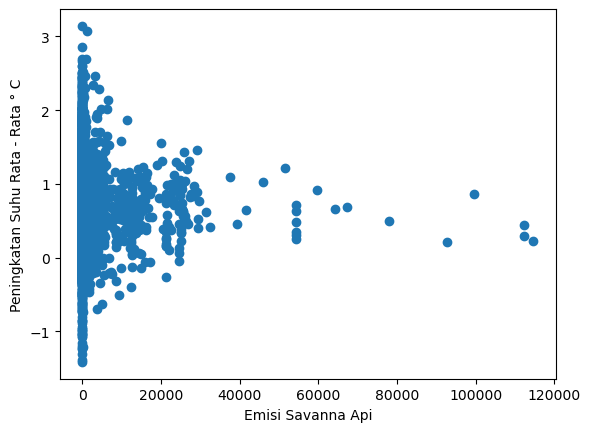

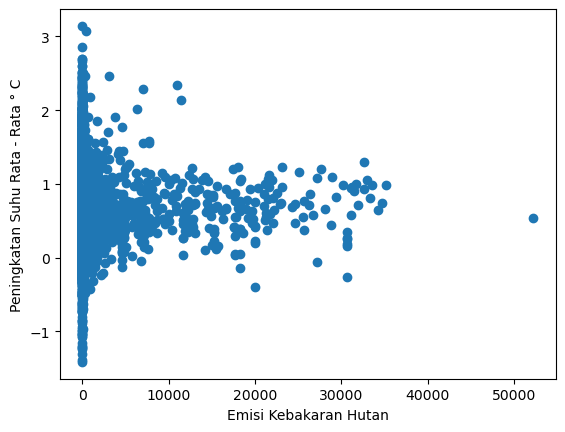

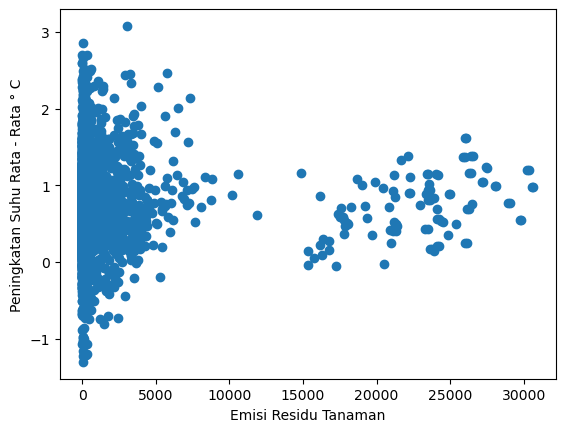

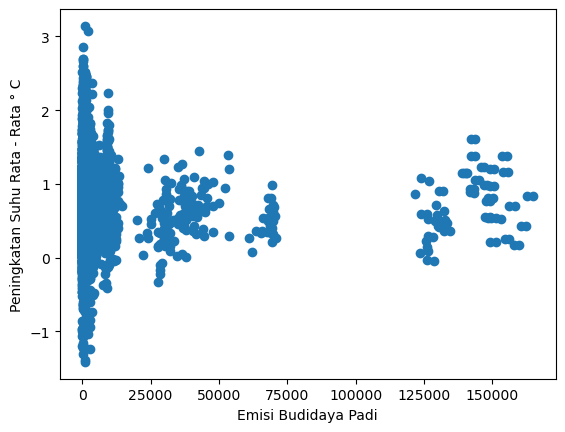

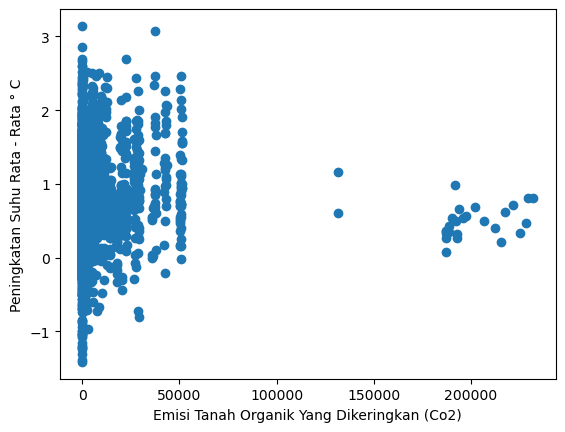

...

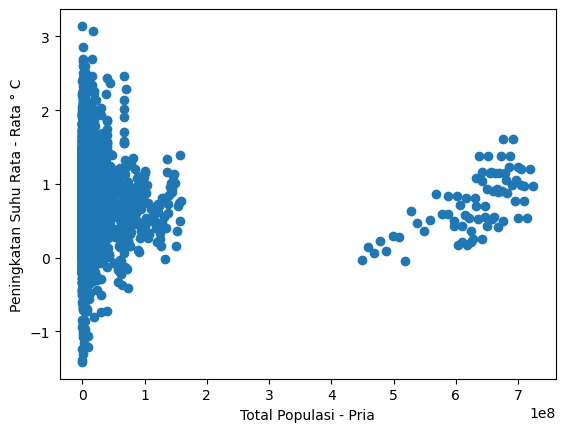

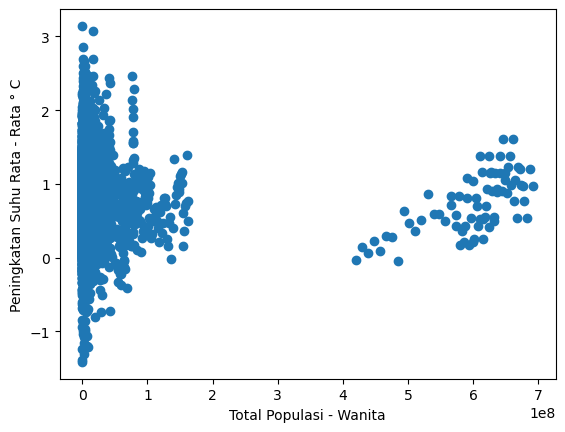

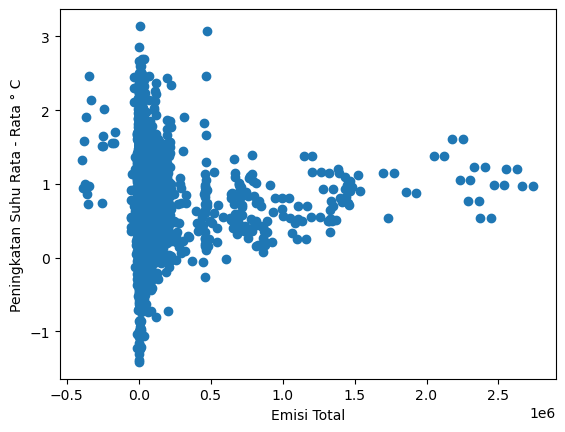

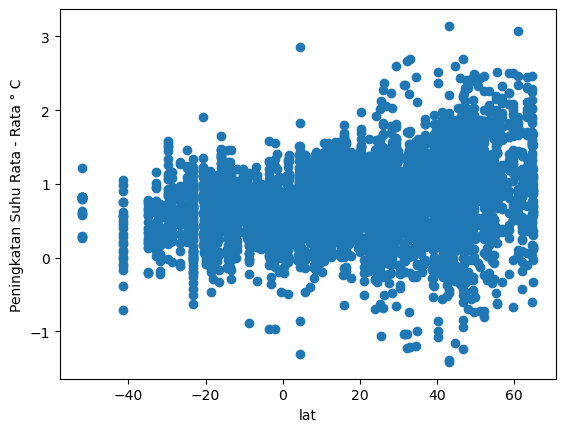

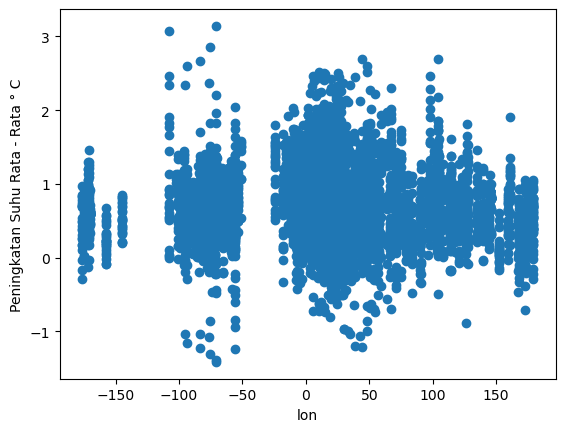

In [102]:
# Scatterplot for each numerical to global warming

temp = df_train.select_dtypes(include=['number']).columns.to_list()
temp.remove('Peningkatan Suhu Rata - Rata ° C')
for i in temp:
    plt.scatter(x=df_train[i], y=df_train['Peningkatan Suhu Rata - Rata ° C'])
    plt.ylabel('Peningkatan Suhu Rata - Rata ° C')
    plt.xlabel(i)
    plt.show()

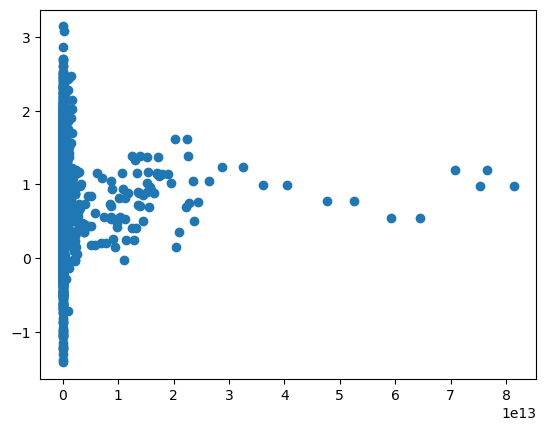

In [130]:
# Experimenting on feature engineering to 2D visual
# plt.scatter(y=df_train['Peningkatan Suhu Rata - Rata ° C'], x=np.log(df_train['Populasi Perkotaan']))
# plt.scatter(y=df_train['Peningkatan Suhu Rata - Rata ° C'], x=np.sqrt(df_train['Populasi Perkotaan']))
plt.scatter(y=df_train['Peningkatan Suhu Rata - Rata ° C'], x=df_train['Emisi Ritel Makanan']*df_train['Populasi Perkotaan'])

In [85]:
# Make a pairplot
sns.pairplot(df_train)

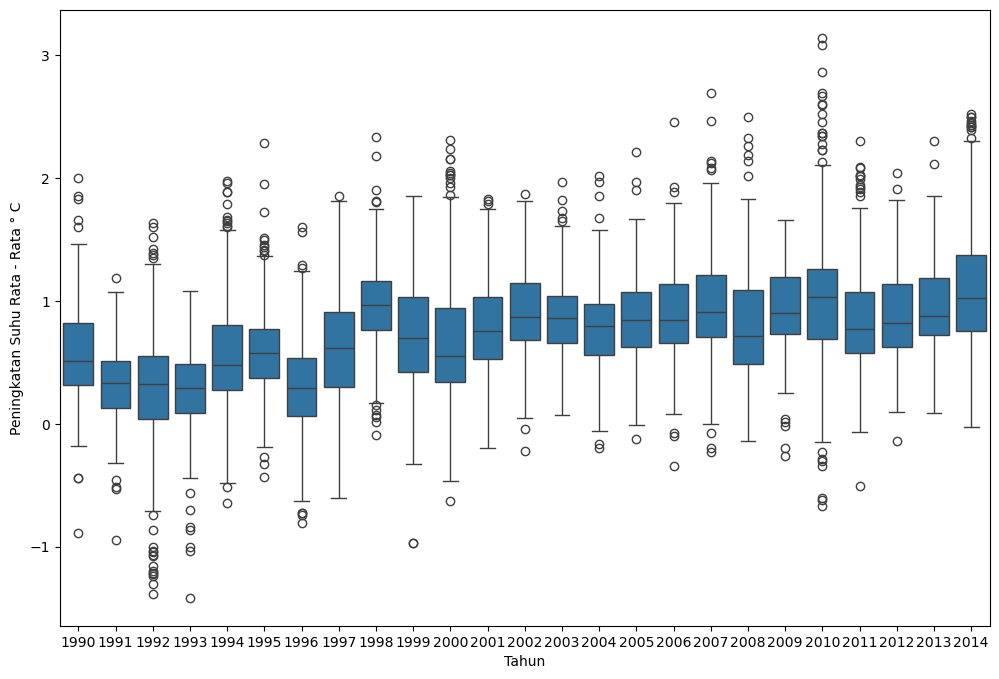

In [88]:
# Check years
plt.figure(figsize=(12,8))
sns.boxplot(df_train, x='Tahun', y='Peningkatan Suhu Rata - Rata ° C')
plt.show()

<Axes: xlabel='Tahun'>

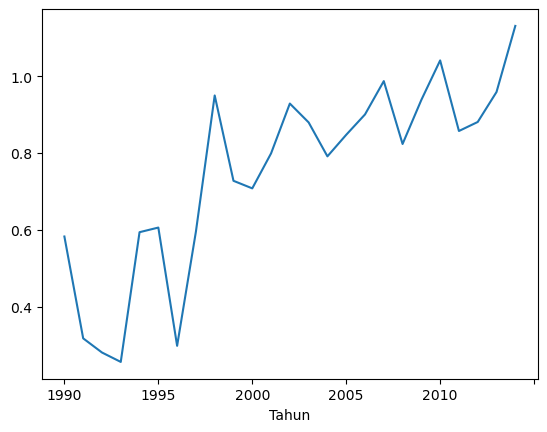

In [89]:
# Check median
df_train.groupby('Tahun')['Peningkatan Suhu Rata - Rata ° C'].mean().plot()

<Axes: xlabel='Tahun'>

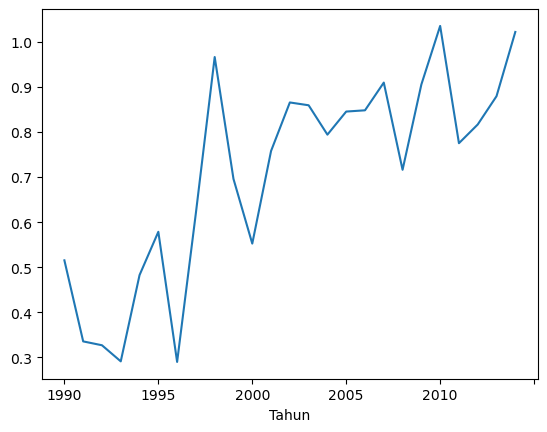

In [90]:
# Check median
df_train.groupby('Tahun')['Peningkatan Suhu Rata - Rata ° C'].median().plot()

In [134]:
# Check data
df_train_nonmissing.head()

,Emisi Budidaya Padi,Emisi Tanah Organik Yang Dikeringkan (Co2),Emisi Pembuatan Pestisida,Emisi Transportasi Makanan,Emisi Ritel Makanan,Emisi Penggunaan Listrik Di Pertanian,Emisi Kemasan Makanan,Emisi Sistem Agrifood Pembuangan Limbah,Emisi Pengolahan Makanan,Emisi Manufaktur Pupuk,Emisi Pupuk Kandang Di Padang Rumput,Emisi Kebakaran Di Tanah Organik,Populasi Pedesaan,Populasi Perkotaan,Total Populasi - Pria,Total Populasi - Wanita,Emisi Total,Peningkatan Suhu Rata - Rata ° C,Tahun,lat,lon
0,686.00,0.0,11.807483,63.1152,109.6446,14.2666,67.631366,691.7888,252.21419,11.9970,1590.5319,0.0,9655167.0,2593947.0,5348387.0,5346409.0,2198.963539,0.536167,1990,33.768006,66.238514
1,678.16,0.0,11.712073,61.2125,116.6789,11.4182,67.631366,710.8212,252.21419,12.8539,1657.2364,0.0,10230490.0,2763167.0,5372959.0,5372208.0,2323.876629,0.020667,1991,33.768006,66.238514
2,686.00,0.0,11.712073,53.3170,126.1721,9.2752,67.631366,743.6751,252.21419,13.4929,1653.5068,0.0,10995568.0,2985663.0,6028494.0,6028939.0,2356.304229,-0.259583,1992,33.768006,66.238514
3,686.00,0.0,11.712073,54.3617,81.4607,9.0635,67.631366,791.9246,252.21419,14.0559,1642.9623,0.0,11858090.0,3237009.0,7003641.0,7000119.0,2368.470529,0.101917,1993,33.768006,66.238514
4,705.60,0.0,11.712073,53.9874,90.4008,8.3962,67.631366,831.9181,252.21419,15.1269,1689.3593,0.0,12690115.0,3482604.0,7733458.0,7722096.0,2500.768729,0.372250,1994,33.768006,66.238514


In [135]:
# Save data
df_train_nonmissing.to_csv('data/train_adj.csv', index=False)

In [136]:
# # Import pycaret
# from pycaret.regression import RegressionExperiment
# s = RegressionExperiment()
# s.setup(df_train_nonmissing, target='Peningkatan Suhu Rata - Rata ° C', session_id=123)

In [138]:
# Get test data adjusted
df_test = df_test.merge(df_lat_lon_country, how='left', left_on='Negara', right_on='country')
df_test

,Emisi Savanna Api,Emisi Kebakaran Hutan,Emisi Residu Tanaman,Emisi Budidaya Padi,Emisi Tanah Organik Yang Dikeringkan (Co2),Emisi Pembuatan Pestisida,Emisi Transportasi Makanan,Lahan Hutan,Konversi Hutan Bersih,Emisi Konsumsi Rumah Tangga Makanan,Emisi Ritel Makanan,Emisi Penggunaan Listrik Di Pertanian,Emisi Kemasan Makanan,Emisi Sistem Agrifood Pembuangan Limbah,Emisi Pengolahan Makanan,Emisi Manufaktur Pupuk,Emisi IPPU,Emisi Kotoran Diterapkan Pada Tanah,Emisi Pupuk Kandang Di Padang Rumput,Emisi Manajemen Pupuk,Emisi Kebakaran Di Tanah Organik,Emisi Kebakaran Di Hutan Tropis Yang Lembab,Penggunaan Energi Di Pertanian,Populasi Pedesaan,Populasi Perkotaan,Total Populasi - Pria,Total Populasi - Wanita,Emisi Total,Negara,Tahun,country,lat,lon
0,0.8454,0.0000,403.3181,642.8800,0.0,81.852555,440.0315,-246.2191,0.0000,1570.3394,370.6039,75.1614,353.93064,3090.5068,1645.129815,27.235400,256.7030,423.5038,2719.1528,797.9007,0.0,0.0,NaN,25368923.0,8367571.0,17071446.0,16682054.0,12652.876111,Afghanistan,2015,Afghanistan,33.768006,66.238514
1,1.6558,0.0000,387.6130,466.4800,0.0,54.909681,340.8931,154.6574,0.0000,1649.8382,425.9346,84.2970,353.93064,3201.0961,1627.654458,27.846900,302.7560,421.9268,2692.9570,793.9377,0.0,0.0,NaN,25985093.0,8670939.0,17520861.0,17115346.0,12988.384380,Afghanistan,2016,Afghanistan,33.768006,66.238514
2,0.4015,0.0000,344.6447,429.0518,0.0,55.148427,345.7609,154.6574,0.0000,1431.5300,477.3314,96.5916,353.93064,3306.1192,1609.985794,35.309400,273.8355,422.4022,2680.8381,768.6802,0.0,0.0,NaN,26558609.0,8971472.0,18028696.0,17614722.0,12786.218762,Afghanistan,2017,Afghanistan,33.768006,66.238514
3,0.2008,0.0000,291.7838,460.7529,0.0,72.743150,407.6310,154.6574,0.0000,1392.5480,534.8263,83.0929,353.93064,3406.9936,1627.654458,35.501200,298.9150,427.5072,2716.9079,789.3364,0.0,0.0,NaN,27099874.0,9273302.0,18549862.0,18136922.0,13054.982649,Afghanistan,2018,Afghanistan,33.768006,66.238514
4,7.1050,0.0000,395.2689,499.9176,0.0,80.806938,489.7252,154.6574,0.0000,1520.2581,590.6114,92.4828,353.93064,3503.2037,1609.985794,35.554900,308.9680,387.9500,2557.4329,766.5012,0.0,0.0,NaN,27626382.0,9582625.0,19090409.0,18679089.0,13354.360473,Afghanistan,2019,Afghanistan,33.768006,66.238514
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1357,1190.0089,232.5068,70.9451,7.4088,0.0,75.000000,251.1465,76500.2982,10662.4408,251.2681,443.0872,428.4352,22.91080,1077.2392,317.074400,2585.080847,858.9820,96.1332,2721.1459,282.5994,0.0,0.0,417.3150,10934468.0,5215894.0,6796658.0,7656047.0,98491.026347,Zimbabwe,2016,Zimbabwe,-18.455496,29.746841
1358,1431.1407,131.1324,108.6262,7.9458,0.0,67.000000,255.7975,76500.2982,10662.4408,203.1236,445.3881,304.7852,18.98570,1093.3441,332.775900,1227.240253,889.4250,81.2314,2744.8763,255.5900,0.0,0.0,398.1644,11201138.0,5328766.0,6940631.0,7810471.0,97159.311553,Zimbabwe,2017,Zimbabwe,-18.455496,29.746841
1359,1557.5830,221.6222,109.9835,8.1399,0.0,66.000000,327.0897,76500.2982,10662.4408,211.1539,492.8599,346.8512,19.05700,1108.5523,348.510700,1127.687805,966.2650,81.0712,2790.0949,257.2735,0.0,0.0,465.7735,11465748.0,5447513.0,7086002.0,7966181.0,97668.308205,Zimbabwe,2018,Zimbabwe,-18.455496,29.746841
1360,1591.6049,171.0262,45.4574,7.8322,0.0,73.000000,290.1893,76500.2982,10662.4408,228.6381,542.5922,350.2168,17.95140,1121.3255,327.820900,2485.528399,945.9420,85.7211,2828.7215,267.5224,0.0,0.0,444.2335,11725970.0,5571525.0,7231989.0,8122618.0,98988.062799,Zimbabwe,2019,Zimbabwe,-18.455496,29.746841


In [141]:
# Adjust remaining
df_test['Tahun'] = df_test['Tahun'].astype(int)
temp = nonmissing_col[:]
temp.remove('Peningkatan Suhu Rata - Rata ° C')
df_test = df_test[temp]
df_test

,Emisi Budidaya Padi,Emisi Tanah Organik Yang Dikeringkan (Co2),Emisi Pembuatan Pestisida,Emisi Transportasi Makanan,Emisi Ritel Makanan,Emisi Penggunaan Listrik Di Pertanian,Emisi Kemasan Makanan,Emisi Sistem Agrifood Pembuangan Limbah,Emisi Pengolahan Makanan,Emisi Manufaktur Pupuk,Emisi Pupuk Kandang Di Padang Rumput,Emisi Kebakaran Di Tanah Organik,Populasi Pedesaan,Populasi Perkotaan,Total Populasi - Pria,Total Populasi - Wanita,Emisi Total,Negara,Tahun,country,lat,lon
0,642.8800,0.0,81.852555,440.0315,370.6039,75.1614,353.93064,3090.5068,1645.129815,27.235400,2719.1528,0.0,25368923.0,8367571.0,17071446.0,16682054.0,12652.876111,Afghanistan,2015,Afghanistan,33.768006,66.238514
1,466.4800,0.0,54.909681,340.8931,425.9346,84.2970,353.93064,3201.0961,1627.654458,27.846900,2692.9570,0.0,25985093.0,8670939.0,17520861.0,17115346.0,12988.384380,Afghanistan,2016,Afghanistan,33.768006,66.238514
2,429.0518,0.0,55.148427,345.7609,477.3314,96.5916,353.93064,3306.1192,1609.985794,35.309400,2680.8381,0.0,26558609.0,8971472.0,18028696.0,17614722.0,12786.218762,Afghanistan,2017,Afghanistan,33.768006,66.238514
3,460.7529,0.0,72.743150,407.6310,534.8263,83.0929,353.93064,3406.9936,1627.654458,35.501200,2716.9079,0.0,27099874.0,9273302.0,18549862.0,18136922.0,13054.982649,Afghanistan,2018,Afghanistan,33.768006,66.238514
4,499.9176,0.0,80.806938,489.7252,590.6114,92.4828,353.93064,3503.2037,1609.985794,35.554900,2557.4329,0.0,27626382.0,9582625.0,19090409.0,18679089.0,13354.360473,Afghanistan,2019,Afghanistan,33.768006,66.238514
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1357,7.4088,0.0,75.000000,251.1465,443.0872,428.4352,22.91080,1077.2392,317.074400,2585.080847,2721.1459,0.0,10934468.0,5215894.0,6796658.0,7656047.0,98491.026347,Zimbabwe,2016,Zimbabwe,-18.455496,29.746841
1358,7.9458,0.0,67.000000,255.7975,445.3881,304.7852,18.98570,1093.3441,332.775900,1227.240253,2744.8763,0.0,11201138.0,5328766.0,6940631.0,7810471.0,97159.311553,Zimbabwe,2017,Zimbabwe,-18.455496,29.746841
1359,8.1399,0.0,66.000000,327.0897,492.8599,346.8512,19.05700,1108.5523,348.510700,1127.687805,2790.0949,0.0,11465748.0,5447513.0,7086002.0,7966181.0,97668.308205,Zimbabwe,2018,Zimbabwe,-18.455496,29.746841
1360,7.8322,0.0,73.000000,290.1893,542.5922,350.2168,17.95140,1121.3255,327.820900,2485.528399,2828.7215,0.0,11725970.0,5571525.0,7231989.0,8122618.0,98988.062799,Zimbabwe,2019,Zimbabwe,-18.455496,29.746841


In [142]:
df_test.drop(['Negara', 'country'], axis=1, inplace=True)
df_test

,Emisi Budidaya Padi,Emisi Tanah Organik Yang Dikeringkan (Co2),Emisi Pembuatan Pestisida,Emisi Transportasi Makanan,Emisi Ritel Makanan,Emisi Penggunaan Listrik Di Pertanian,Emisi Kemasan Makanan,Emisi Sistem Agrifood Pembuangan Limbah,Emisi Pengolahan Makanan,Emisi Manufaktur Pupuk,Emisi Pupuk Kandang Di Padang Rumput,Emisi Kebakaran Di Tanah Organik,Populasi Pedesaan,Populasi Perkotaan,Total Populasi - Pria,Total Populasi - Wanita,Emisi Total,Tahun,lat,lon
0,642.8800,0.0,81.852555,440.0315,370.6039,75.1614,353.93064,3090.5068,1645.129815,27.235400,2719.1528,0.0,25368923.0,8367571.0,17071446.0,16682054.0,12652.876111,2015,33.768006,66.238514
1,466.4800,0.0,54.909681,340.8931,425.9346,84.2970,353.93064,3201.0961,1627.654458,27.846900,2692.9570,0.0,25985093.0,8670939.0,17520861.0,17115346.0,12988.384380,2016,33.768006,66.238514
2,429.0518,0.0,55.148427,345.7609,477.3314,96.5916,353.93064,3306.1192,1609.985794,35.309400,2680.8381,0.0,26558609.0,8971472.0,18028696.0,17614722.0,12786.218762,2017,33.768006,66.238514
3,460.7529,0.0,72.743150,407.6310,534.8263,83.0929,353.93064,3406.9936,1627.654458,35.501200,2716.9079,0.0,27099874.0,9273302.0,18549862.0,18136922.0,13054.982649,2018,33.768006,66.238514
4,499.9176,0.0,80.806938,489.7252,590.6114,92.4828,353.93064,3503.2037,1609.985794,35.554900,2557.4329,0.0,27626382.0,9582625.0,19090409.0,18679089.0,13354.360473,2019,33.768006,66.238514
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1357,7.4088,0.0,75.000000,251.1465,443.0872,428.4352,22.91080,1077.2392,317.074400,2585.080847,2721.1459,0.0,10934468.0,5215894.0,6796658.0,7656047.0,98491.026347,2016,-18.455496,29.746841
1358,7.9458,0.0,67.000000,255.7975,445.3881,304.7852,18.98570,1093.3441,332.775900,1227.240253,2744.8763,0.0,11201138.0,5328766.0,6940631.0,7810471.0,97159.311553,2017,-18.455496,29.746841
1359,8.1399,0.0,66.000000,327.0897,492.8599,346.8512,19.05700,1108.5523,348.510700,1127.687805,2790.0949,0.0,11465748.0,5447513.0,7086002.0,7966181.0,97668.308205,2018,-18.455496,29.746841
1360,7.8322,0.0,73.000000,290.1893,542.5922,350.2168,17.95140,1121.3255,327.820900,2485.528399,2828.7215,0.0,11725970.0,5571525.0,7231989.0,8122618.0,98988.062799,2019,-18.455496,29.746841


In [143]:
df_test.to_csv('data/test_adj.csv')